In [6]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [7]:
from mlbi_at_dku_lib.deg import get_population, plot_population
from mlbi_at_dku_lib.cpdb import cpdb_run, cpdb_get_results, cpdb_plot, cpdb_get_gp_n_cp, plot_circ
from mlbi_at_dku_lib.gsea import run_gsea_all, plot_gsea_res, select_samples, run_enrichr
from mlbi_at_dku_lib.misc import plot_sankey_e #, plot_dot

from pdot import plot_dot

In [ ]:
from google.colab import files

In [ ]:
uploaded = files.upload()

In [ ]:
!ls

## Checking out the results

In [24]:
file = 'results/brca_8k_csv.h5ad'
os.path.isfile(file)

True

In [25]:
adata_t = anndata.read_h5ad(file)
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'tumor_dec', 'tumor_score', 'celltype_minor_rev'
    var: 'gene'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG_for_B cell', 'DEG_for_Endothelial cell', 'DEG_for_Epithelial cell', 'DEG_for_Fibroblast', 'DEG_for_Macrophage', 'DEG_for_Plasma cell', 'DEG_for_Smooth muscle cell', 'DEG_for_T cell CD4+', 'DEG_for_T cell CD8+', 'DEG_for_Tumor cell', 'Ref_celltypes_for_cnv', 'cnv'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca'

### visualize celltype annotation

In [26]:
adata = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes = 2000) # , flavor = 'seurat_v3')

## PCA
N_pca = 15
sc.tl.pca(adata, svd_solver='arpack', n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca)
sc.tl.leiden(adata, resolution = 1)

sc.tl.umap(adata) 

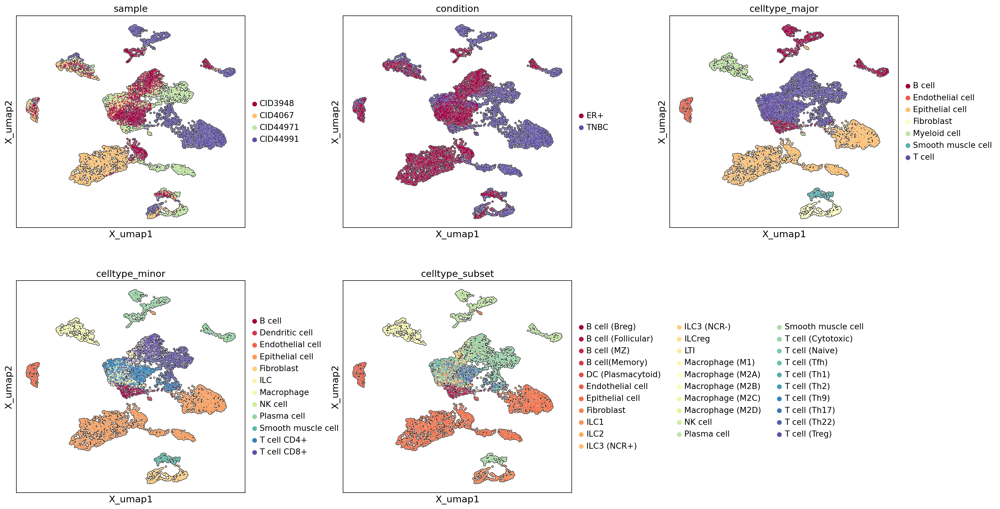

In [27]:
items_to_plot = ['sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset'] 

# adata.obsm['X_umap'] = adata.obsm['X_org_umap']
sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, 
                       ncols = 3, palette = 'Spectral', return_fig = True, add_outline = True) 

plt.show()

In [28]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata.obs.columns.values):
    celltype_col = 'celltype_minor'

df_cnt, df_pct= get_population( adata.obs['sample'], 
                                adata.obs[celltype_col], sort_by = [] )
df_cnt

,B cell,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+,Tumor cell
CID3948,74,0,70,0,7,343,97,1,204,60,477,439,228
CID4067,30,0,99,0,71,166,152,4,1,50,82,120,1225
CID44971,106,19,48,150,139,26,145,11,12,51,547,505,241
CID44991,17,2,15,5,66,1,60,2,442,15,164,92,1119


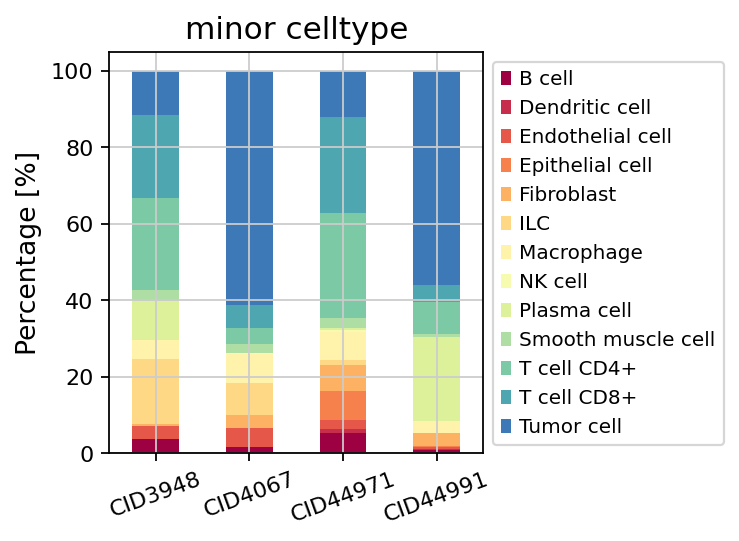

In [29]:
plot_population( df_pct, title = 'minor celltype', title_fs = 14, 
                 label_fs = 12, tick_fs = 10, tick_rot = 20,
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(3, 3.3), return_fig = False)
plt.show()

In [30]:
## Tumor identification: UMAP, CNV heatmap, tumor markers, dotplot
lst = [adata.obs['celltype_minor'], adata.obs['celltype_major'], adata.obs['tumor_dec']]
plot_sankey_e( lst, title = None, fs = 13, WH = (600, 400), th = 10, title_y = 0.8 )

In [32]:
adata

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'tumor_dec', 'tumor_score', 'celltype_minor_rev', 'leiden'
    var: 'gene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG_for_B cell', 'DEG_for_Endothelial cell', 'DEG_for_Epithelial cell', 'DEG_for_Fibroblast', 'DEG_for_Macrophage', 'DEG_for_Plasma cell', 'DEG_for_Smooth muscle cell', 'DEG_for_T cell CD4+', 'DEG_for_T cell CD8+', 'DEG_for_Tumor cell', 'Ref_celltypes_for_cnv', 'cnv', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'sample_colors', 'condition_colors', 'celltype_major_colors', 'celltype_minor_colors', 'celltype_subset_colors'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [33]:
mkr_dict

{'B cell (Breg)': array(['CD40', 'IGHM', 'CD5', 'CD19', 'CD38', 'TCF3', 'EBF1', 'POU2F2',
        'PAX5', 'POU2AF1', 'CD24', 'CD1D', 'CR2'], dtype=object),
 'B cell (Follicular)': array(['FCER2', 'IGHM', 'CD19', 'CD38', 'IGHD', 'TNFRSF13B', 'PAX5',
        'CD24', 'CXCR4', 'CXCR5', 'MS4A1', 'CD22', 'CR2'], dtype=object),
 'B cell (MZ)': array(['CD1C', 'FCER2', 'IGHM', 'CD19', 'IGHD', 'TNFRSF13B', 'TCF3',
        'EBF1', 'POU2F2', 'PAX5', 'CD27', 'FCRL3', 'MS4A1', 'CR2'],
       dtype=object),
 'B cell(Memory)': array(['CD40', 'FCER2', 'CD19', 'PTPRJ', 'TNFRSF13B', 'SPIB', 'POU2AF1',
        'PAX5', 'FAS', 'CD27', 'CD86', 'CD80', 'MS4A1', 'CR2'],
       dtype=object),
 'Basophil': array(['ITGA2', 'PTGDR2', 'ENPP3', 'ITGAX', 'CEBPA', 'PTPRC', 'CCR3',
        'IL3RA', 'FCER1A', 'CD22', 'CD69'], dtype=object),
 'DC (Classical)': array(['CD40', 'CD207', 'CX3CR1', 'CLEC9A', 'CD1A', 'CADM1', 'IL3RA',
        'CCR7', 'CD209', 'CD1C', 'CD14', 'EPCAM', 'XCR1', 'CD80', 'THBD',
        'CD83', 'IT

In [31]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
target_lst = list(adata_t.obs['celltype_subset'].unique())

title = 'subset marker expression profile  \n \n  \n \n '

pes, pexs, md = plot_dot( adata, target_lst, 'celltype_subset', mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = None, other_genes = [], show_unassigned = False, 
                          add_rect = True, standard_scale = 'var', figsize = None )


ValueError: operands could not be broadcast together with shapes (0,) (16,) 

### visualize infercnv & tumor cell identification

In [34]:
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'tumor_dec', 'tumor_score', 'celltype_minor_rev'
    var: 'gene'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG_for_B cell', 'DEG_for_Endothelial cell', 'DEG_for_Epithelial cell', 'DEG_for_Fibroblast', 'DEG_for_Macrophage', 'DEG_for_Plasma cell', 'DEG_for_Smooth muscle cell', 'DEG_for_T cell CD4+', 'DEG_for_T cell CD8+', 'DEG_for_Tumor cell', 'Ref_celltypes_for_cnv', 'cnv'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca'

In [35]:
chr_pos = adata.uns['cnv']['chr_pos']
X_cnv = adata.obsm['X_cnv']
chrs = np.array([' ']*X_cnv.shape[1])

df_chr_pos = pd.DataFrame({'chr_pos': list(chr_pos.values())}, index = chr_pos.keys())
df_chr_pos = df_chr_pos.sort_values('chr_pos')

## Get chromosome name for each loci in X_cnv
chrs = []
for i in range(df_chr_pos.shape[0]):
    if i < (df_chr_pos.shape[0]-1):
        start = df_chr_pos.iloc[i][0]
        end = df_chr_pos.iloc[i+1][0]
    else:
        start = df_chr_pos.iloc[i][0]
        end = X_cnv.shape[1]
    
    chrs = chrs + list([df_chr_pos.index.values[i]]*(end-start))
    
df_chr = pd.DataFrame({'chr': chrs})

lst = list(df_chr['chr'].unique())

## Get vg_pos & vg_labels
cnt = 0
vg_pos = []
vg_labels = []
for i in lst:
    b = df_chr['chr'] == i
    vg_pos.append((cnt, cnt+np.sum(b)-10))
    vg_labels.append(i)
    cnt += np.sum(b)
    
## Create AnnData for plot
ad = anndata.AnnData(X = X_cnv, var = df_chr, obs = adata.obs)

Text(0.5, 1.0, 'log2(CNR)\n \n ')

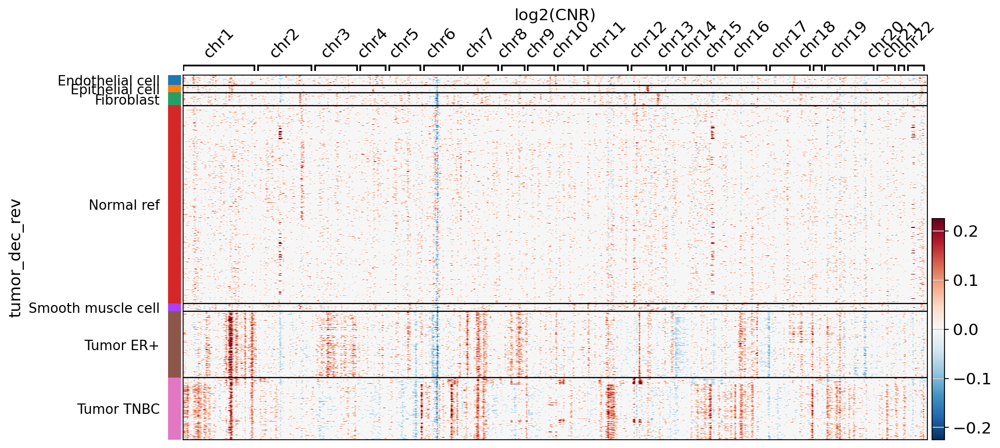

In [36]:
cond_col = 'condition'
clst = ad.obs[cond_col].unique()
ad.obs['tumor_dec_rev'] = ad.obs['celltype_major'].copy(deep = True).astype(str)
b = ad.obs['tumor_dec_rev'].isin(adata_t.uns['Ref_celltypes_for_cnv'])
ad.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'
for c in clst:
    b = (ad.obs[cond_col] == c) & (ad.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    ad.obs.loc[b, 'tumor_dec_rev'] = s

X = np.abs(ad.to_df())
vmax = X.quantile([0.99]).mean(axis = 1)*2

ax_dict = sc.pl.heatmap(ad, var_names = ad.var.index.values, groupby = 'tumor_dec_rev', 
                        show = False, figsize = (12, 6), swap_axes = False, 
                        show_gene_labels = False, # dendrogram = True, 
                        var_group_positions = vg_pos, var_group_labels = vg_labels, 
                        var_group_rotation = 45, cmap='RdBu_r', vmax = vmax, vmin = -vmax)

# ax_dict['groupby_ax'].set_ticks(labelsize = 14)
plt.title('log2(CNR)\n \n ', fontsize = 14)
# ax_dict['heatmap_ax'].set_xticks(range(len(ad.var_names))[::5])
# ax_dict['heatmap_ax'].set_xticklabels(ad.var_names[::5], fontsize = 5)  



In [37]:
N_pca = 15
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca, 
                use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
# sc.tl.leiden(adata, resolution = 1)
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)    
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

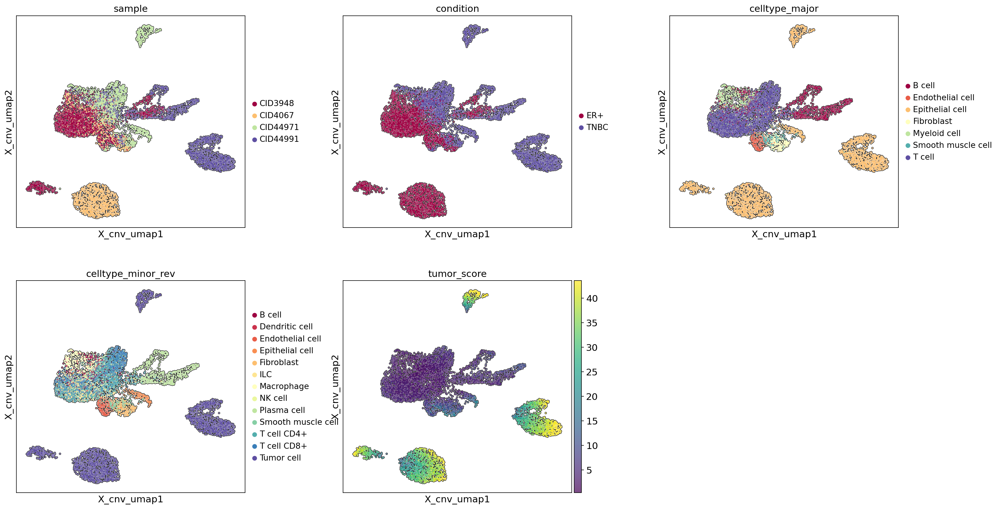

In [38]:
items_to_plot = ['sample', 'condition', 'celltype_major', 'celltype_minor_rev', 'tumor_score'] 

sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, ncols = 3, 
                       palette = 'Spectral', return_fig = False, add_outline = True) 

plt.show()

### visualize cell-cell interaction

In [39]:
df_dct = adata.uns['CCI']
cond_lst = list(df_dct.keys())
cond_lst

['ER+', 'TNBC']

In [40]:
### Remove common CCI
idx_dct = {}
idxo_dct = {}
celltype_lst = []

for j, g in enumerate(df_dct.keys()):
    idx_dct[g] = list(df_dct[g].index.values)
    if j == 0:
        idx_c = idx_dct[g]
    else:
        idx_c = list(set(idx_c).intersection(idx_dct[g]))
    
    ctA = list(df_dct[g]['cell_A'].unique())
    ctB = list(df_dct[g]['cell_B'].unique())
    celltype_lst = list(set(celltype_lst).union(ctA + ctB))
    
for g in df_dct.keys():
    idxo_dct[g] = list(set(idx_dct[g]) - set(idx_c))

dfs_dct = {}
for g in df_dct.keys():
    dfs_dct[g] = df_dct[g].loc[idxo_dct[g],:]

celltype_lst.sort()
# len(idx_c), celltype_lst

In [41]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata.obs.columns.values):
    celltype_col = 'celltype_minor'

df_cnt, df_pct= get_population( adata.obs['condition'], 
                                adata.obs[celltype_col], sort_by = [] )
df_cnt

,B cell,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+,Tumor cell
ER+,104,0,169,0,78,509,249,5,205,110,559,559,1453
TNBC,123,21,63,155,205,27,205,13,454,66,711,597,1360


In [42]:
b = df_cnt.min(axis = 0) >= 50
celltype_lst = list(df_cnt.columns.values[b])
celltype_lst.sort()
celltype_lst

['B cell',
 'Endothelial cell',
 'Fibroblast',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+',
 'T cell CD8+',
 'Tumor cell']

In [43]:
df_lst = {}
for g in df_dct.keys():
    b = dfs_dct[g]['cell_A'].isin(celltype_lst) & (dfs_dct[g]['cell_B'].isin(celltype_lst))
    dfs = dfs_dct[g].loc[b,:]
    df = pd.DataFrame(index = celltype_lst, columns = celltype_lst)
    df.loc[:] = 0
    for a, b in zip(dfs['cell_A'], dfs['cell_B']):
        df.loc[a,b] += 1

    df_lst[g] = df

/home/comp_serv/anaconda3/envs/py39/lib/python3.8/site-packages/mlbi_at_dku_lib/cpdb.py:513: RuntimeWarning:

divide by zero encountered in log2

/home/comp_serv/anaconda3/envs/py39/lib/python3.8/site-packages/mlbi_at_dku_lib/cpdb.py:513: RuntimeWarning:

divide by zero encountered in log2



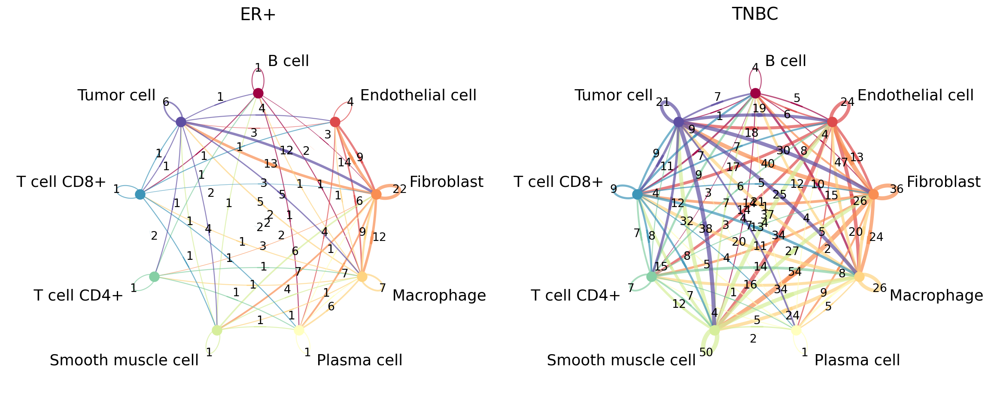

In [44]:
nr, nc = 1, len(cond_lst)
fig, axes = plt.subplots(figsize = (7*nc,6*nr), nrows=nr, ncols=nc, # constrained_layout=True, 
                         gridspec_kw={'width_ratios': [1]*nc})
fig.tight_layout() 
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.35, hspace=1)

for j, k in enumerate(cond_lst):

    df = df_lst[k]*(df_lst[k] > 0).copy(deep = True)
    
    plt.subplot(nr,nc,j+1)
    plot_circ( df, title = k, title_fs = 18, 
               text_fs = 16, num_fs = 12, margin = 0.15, alpha = 0.7, 
               N = 500, R = 3, lw_max = 20, lw_scale = 0.5, log_lw = True, 
               node_size = 10, rot = False, cmap = 'Spectral', 
               ax = axes[j], show = False)
plt.show()

In [45]:
pval_cutoff = 0.01
mean_cutoff = 1

idx_lst_all = []
for k in df_dct.keys():
    b = df_dct[k]['pval'] <= pval_cutoff
    b = b & df_dct[k]['mean'] >= mean_cutoff
    idx_lst_all = idx_lst_all + list(df_dct[k].index.values[b])
    
idx_lst_all = list(set(idx_lst_all))
display('Union of Interactions: %i' % len(idx_lst_all))    

df_dct_to_plot = {}
for k in df_dct.keys():
    df = df_dct[k]
    dfv = pd.DataFrame(index = idx_lst_all, columns = df.columns)
    dfv['mean'] = 0
    dfv['pval'] = 1

    idxt = list(set(idx_lst_all).intersection(list(df.index.values)))
    cols = list(df.columns.values)
    cols.remove('mean')
    cols.remove('pval')
    dfv.loc[idxt, cols] = df.loc[idxt, cols]
    dfv.loc[idxt, 'mean'] = df.loc[idxt, 'mean']
    dfv.loc[idxt, 'pval'] = df.loc[idxt, 'pval']

    gp, cp, ga, gb, ca, cb = [], [], [], [], [], []
    for s in list(dfv.index.values):
        gpt, cpt, gat, gbt, cat, cbt = cpdb_get_gp_n_cp(s)

        gp = gp + [gpt]
        cp = cp + [cpt]
        ga = ga + [gat]
        gb = gb + [gbt]
        ca = ca + [cat]
        cb = cb + [cbt]

    dfv['gene_pair'] = gp
    dfv['cell_pair'] = cp
    dfv['gene_A'] = ga
    dfv['gene_B'] = gb
    dfv['cell_A'] = ca
    dfv['cell_B'] = cb
    
    df_dct_to_plot[k] = dfv
    # print(dfv.shape)

'Union of Interactions: 3543'

In [46]:
## CCI: circle plot, dotplot, pairwise venn diagram
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    ax = cpdb_plot( dfs, mkr_sz = 9, tick_sz = 9, 
                    legend_fs = 9, title_fs = 34, dpi = 120,
                    title = 'CPDB result for %s' % g, swap_ax = True )

169 cell_pairs, 575 gene_pairs found


169 cell_pairs, 575 gene_pairs found


### visualize DEG

In [ ]:
## DEG: scanpy stype, (marker_dict), marker-dotplot, 

In [47]:
adata

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'tumor_dec', 'tumor_score', 'celltype_minor_rev', 'leiden'
    var: 'gene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG_for_B cell', 'DEG_for_Endothelial cell', 'DEG_for_Epithelial cell', 'DEG_for_Fibroblast', 'DEG_for_Macrophage', 'DEG_for_Plasma cell', 'DEG_for_Smooth muscle cell', 'DEG_for_T cell CD4+', 'DEG_for_T cell CD8+', 'DEG_for_Tumor cell', 'Ref_celltypes_for_cnv', 'cnv', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'sample_colors', 'condition_colors', 'celltype_major_colors', 'celltype_minor_colors', 'celltype_subset_colors', 'cnv_neighbors', 'celltype_minor_rev_colors'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'X_umap', 'X_cnv_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

In [48]:
target = 'Tumor cell'

df_deg_dct = adata_t.uns['DEG_for_%s' % target]
df_deg_dct.keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

/tmp/ipykernel_367662/1321778869.py:25: RuntimeWarning:

divide by zero encountered in log10



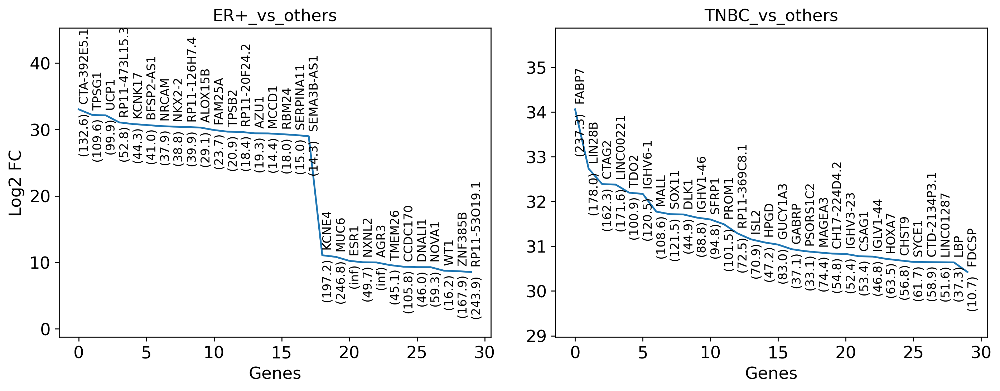

In [49]:
n_genes = 30
pval_cutoff = 0.05

nr, nc = 1, len(df_deg_dct.keys())
fig, axes = plt.subplots(figsize = (6*nc,4*nr), nrows=nr, ncols=nc, # constrained_layout=True, 
                         gridspec_kw={'width_ratios': [1]*nc})
fig.tight_layout() 
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.15, hspace=1)

for j, key in enumerate(df_deg_dct.keys()):
    b = df_deg_dct[key]['pval_adj'] <= pval_cutoff
    dfs = df_deg_dct[key].loc[b,:].sort_values('log2_FC', ascending = False)
    dfs = dfs.iloc[:min(n_genes, np.sum(b))]

    plt.subplot(nr,nc,j+1)
    # plt.figure(figsize = (6,4), dpi = 100)
    X = list(np.arange(dfs.shape[0]))
    Y = list(dfs['log2_FC'])
    plt.plot(X, Y)
    m = (np.max(Y)-np.min(Y))
    plt.ylim([np.min(Y)-m*0.4, np.max(Y) + m*0.5])
    tlst = list(dfs.index.values)
    for x, y, t in zip(X, Y, tlst):
        plt.text(x, y, '  %s' % (t), rotation = 90, fontsize = 10)
        lpv =  -np.log10(dfs.loc[t,'pval_adj'])
        plt.text(x, y, '(%3.1f) ' % (lpv), rotation = 90, va = 'top', fontsize = 10)
    plt.title(key)
    plt.xlabel('Genes')
    if j%nc == 0: plt.ylabel('Log2 FC')
    plt.grid()
    
plt.show()

In [168]:
## GSEA: barplot

## 추가할 것
1. marker_dict 추가 --> dot plot 그릴 떄 필요
2. inferCNV 에서 gene, chromosome location 저장
2. Tumor ID를 먼저 수행하고 CCI 수행시 Tumor cell 포함 시킬 것
